In [1]:
import sys, os
import tensorflow as tf
sys.path.append("/visuworks/Blindless_AIFFELTON/Ablation Study/")

# import customized modules
import preprocess, data_generator, check_result, metrics, loss, train

sys.path.append("/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet")
import dense_unet

# Insert Path
# {model_name}_{epoch}ep_{model_inpusize}_{Generator | aG/fG/sG}
FILE_NAME = 'dense_unet_50ep_1024_fG_wo_slice'
INPUT_SHAPE = (1024, 1024, 1)
MODEL_PATH = "/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/" + FILE_NAME + ".tf"
HISTORY_PATH = "/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/history/" + FILE_NAME + '_history' ".json"

TRAIN_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Train'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'

2024-02-15 13:01:53.118926: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-15 13:01:53.118949: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-15 13:01:53.119965: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-15 13:01:53.125200: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-02-15 13:01:53.697897: W tensorflow/compiler/tf2

2024-02-15 12:36:41.005117: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-15 12:36:41.040937: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-15 12:36:41.041137: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

=====IOSTAR_STAR 30_ODC.jpg result======
sensitivity: 0.5822267620020429
specificity: 0.9950198665037447
IOU: 0.5515421408543625


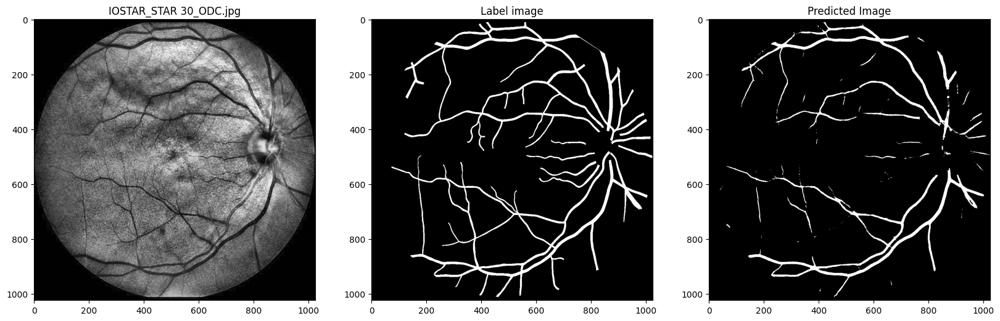

=====IOSTAR_STAR 24_OSC.jpg result======
sensitivity: 0.6592154371476217
specificity: 0.9946763574774568
IOU: 0.616921400084223


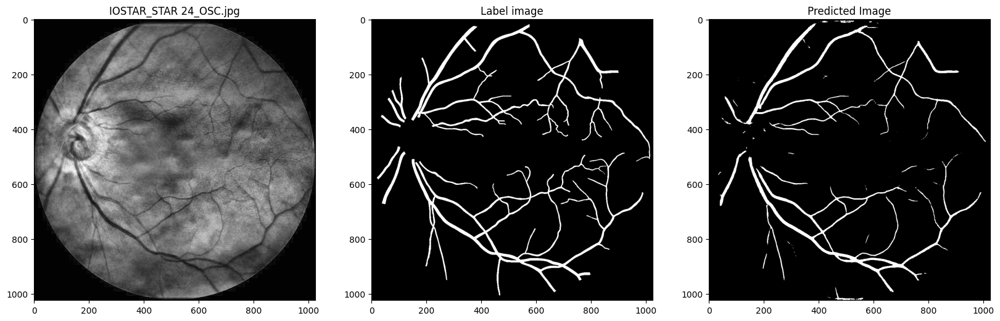

=====IOSTAR_STAR 40_OSC.jpg result======
sensitivity: 0.741740175514184
specificity: 0.9906620101668302
IOU: 0.6732807772266018


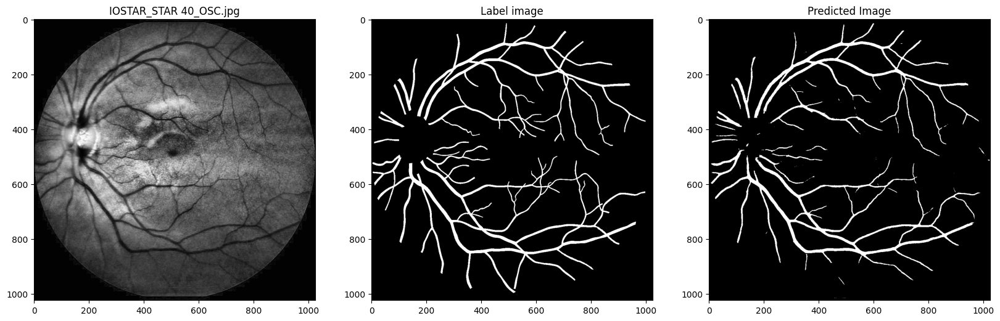

=====IOSTAR_STAR 16_OSN.jpg result======
sensitivity: 0.7217581306855342
specificity: 0.988207479873637
IOU: 0.6158304586038961


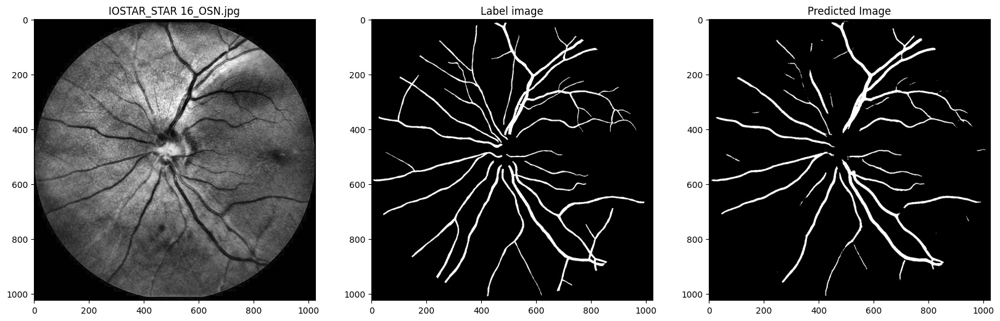

=====IOSTAR_STAR 48_OSN.jpg result======
sensitivity: 0.7482269958319975
specificity: 0.991661867234837
IOU: 0.6778709857322117


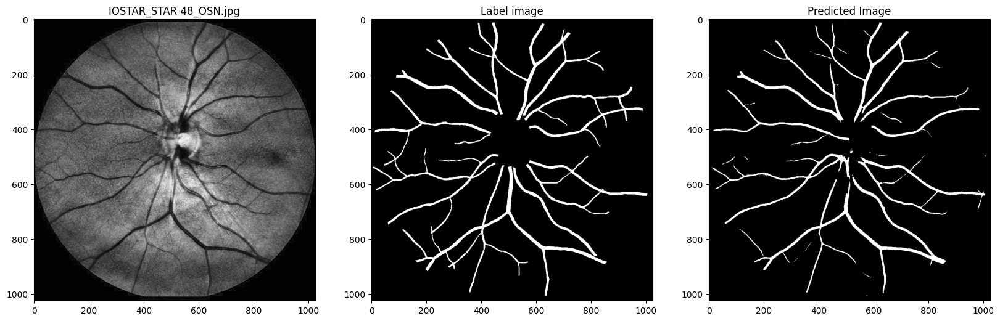

=====IOSTAR_STAR 45_ODC.jpg result======
sensitivity: 0.8869476007647707
specificity: 0.9785175002514623
IOU: 0.6675479953671748


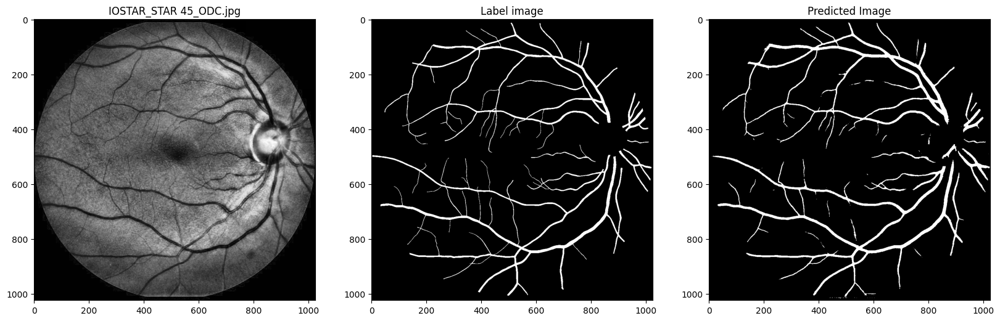

=====IOSTAR_STAR 32_ODC.jpg result======
sensitivity: 0.8635178676039836
specificity: 0.9691205513436758
IOU: 0.5982790636320281


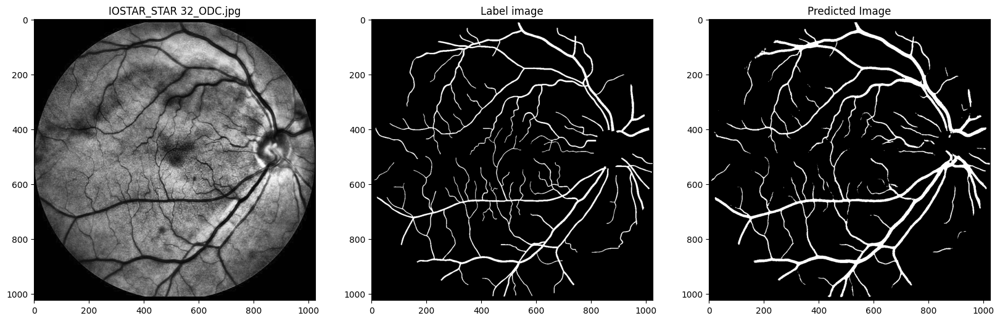

In [2]:
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy,
                  'f1_score' : metrics.f1_score,
                  'iou' : metrics.iou}

MODEL_PATH = '/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_50ep_1024_fG_wo_slice.tf/40--0.1586-0.8102-0.9867-0.2157-0.7390-0.9843.pb'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'
test_preproc = preprocess.build_augmentation_for_general(INPUT_SHAPE[0], INPUT_SHAPE[0], is_train=False)
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

# file_list = ["AFIO", "ARIA", "Chase", "DR_HAGIS", "DRIVE", "DualModal", "FIVES", "HRF", "IOSTAR", "LES-AV", "ORVS", "RETA", "STARE", "TREND", "UoA-DR"]
# for file in file_list:
metrics.plot_result(TEST_SOURCE, "IOSTAR", model=model, img_size=INPUT_SHAPE, preproc=test_preproc)

2024-02-15 13:02:23.730454: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-15 13:02:23.765442: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-02-15 13:02:23.765648: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

=====AFIO_IM001791.JPG result======
sensitivity: 0.6278977990257983
specificity: 0.9910885436634274
IOU: 0.5726640751938463


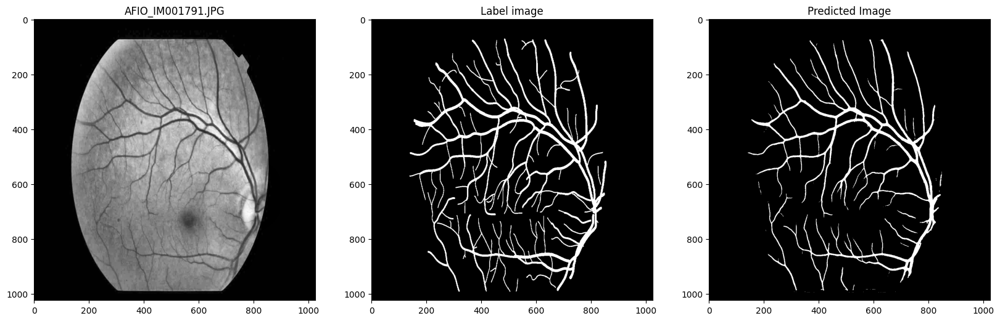

=====AFIO_IM001097.JPG result======
sensitivity: 0.6457981796011873
specificity: 0.9878032014141216
IOU: 0.5638563286374879


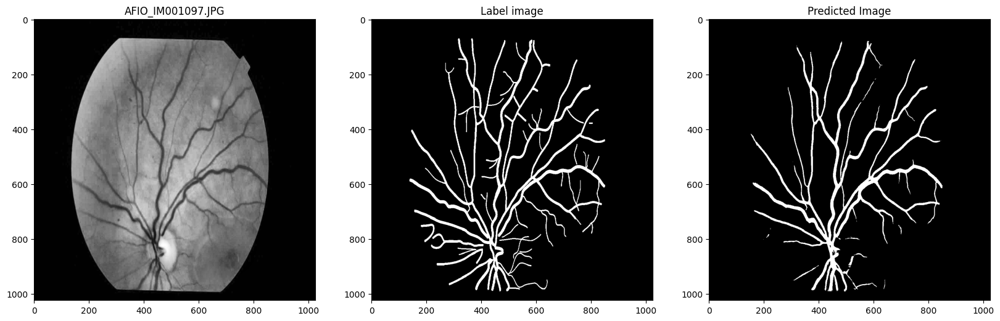

=====AFIO_IM005523.JPG result======
sensitivity: 0.6164176488629891
specificity: 0.9905378132299297
IOU: 0.5607772795216741


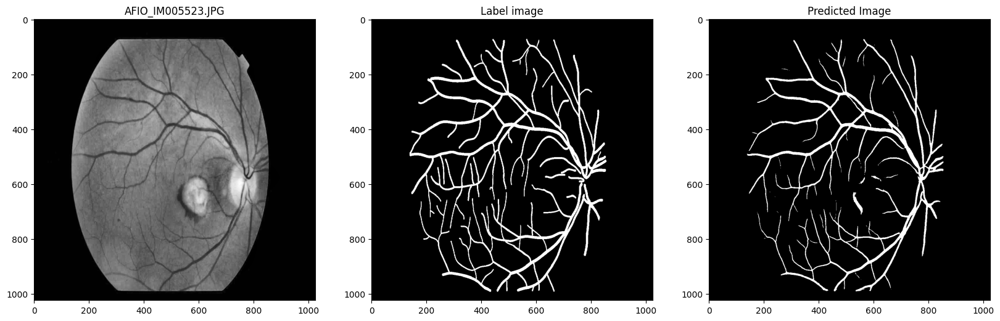

=====AFIO_IM000024.JPG result======
sensitivity: 0.6179890628393185
specificity: 0.9883087172056361
IOU: 0.5022946084724005


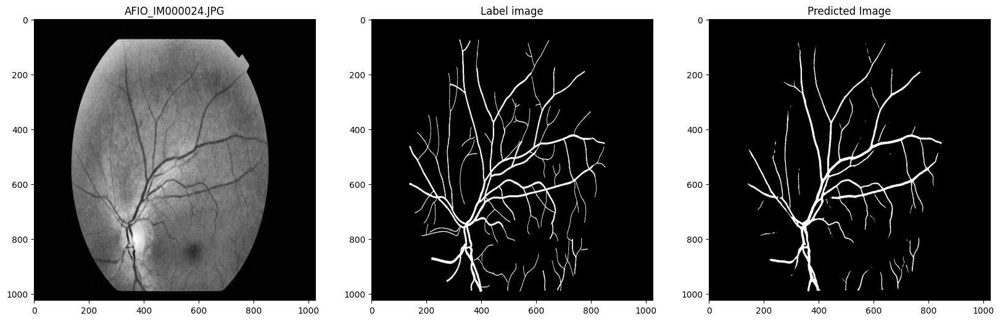

=====AFIO_IM005191.JPG result======
sensitivity: 0.5849225298450597
specificity: 0.9924548834869404
IOU: 0.545210902134591


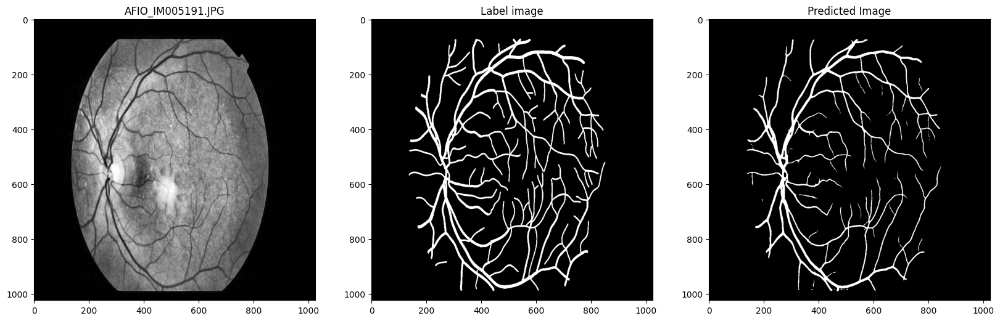

=====AFIO_IM001154.JPG result======
sensitivity: 0.6108616060532097
specificity: 0.9900727885160495
IOU: 0.5468231078482783


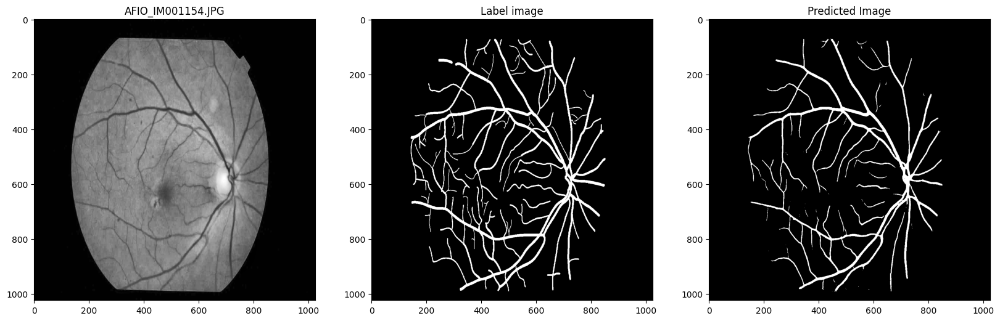

=====AFIO_IM001155.JPG result======
sensitivity: 0.6064392731909468
specificity: 0.9909065702143275
IOU: 0.5451190298806836


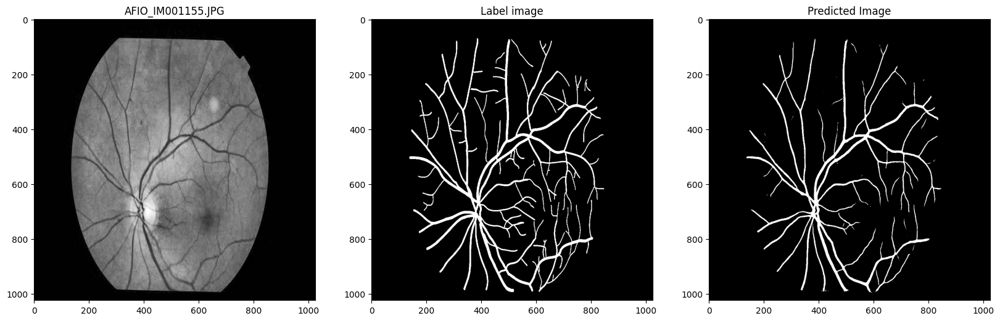

=====AFIO_IM001218.JPG result======
sensitivity: 0.5909368138570383
specificity: 0.9917102518301485
IOU: 0.5535983936398586


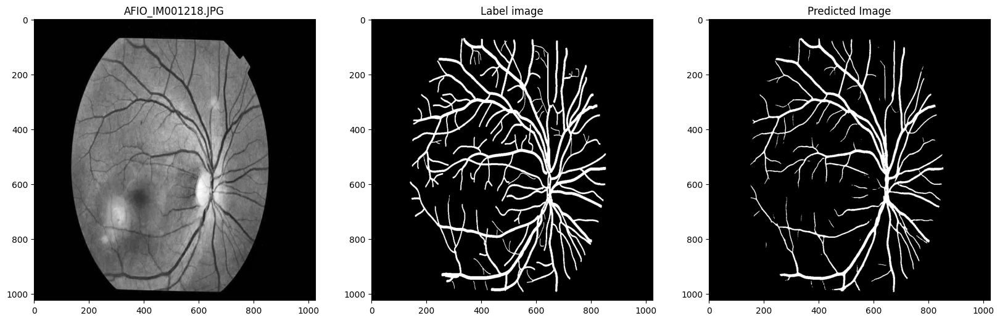

=====AFIO_IM001859.JPG result======
sensitivity: 0.6330412979781046
specificity: 0.9915977619882915
IOU: 0.5651998490232062


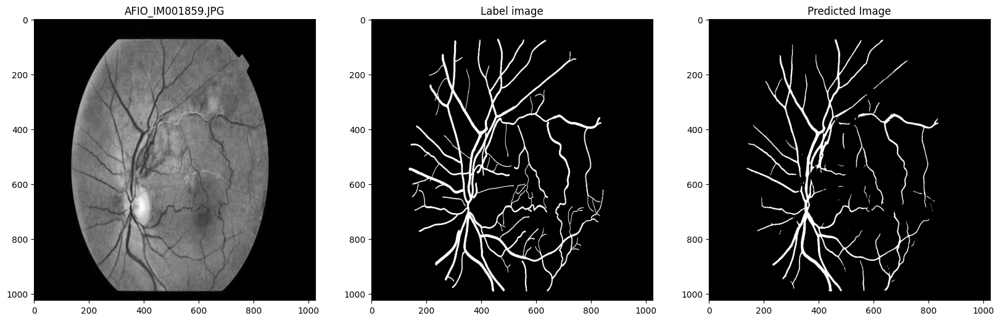

=====AFIO_IM003631.JPG result======
sensitivity: 0.56888219749213
specificity: 0.9895962122284617
IOU: 0.5150807420258908


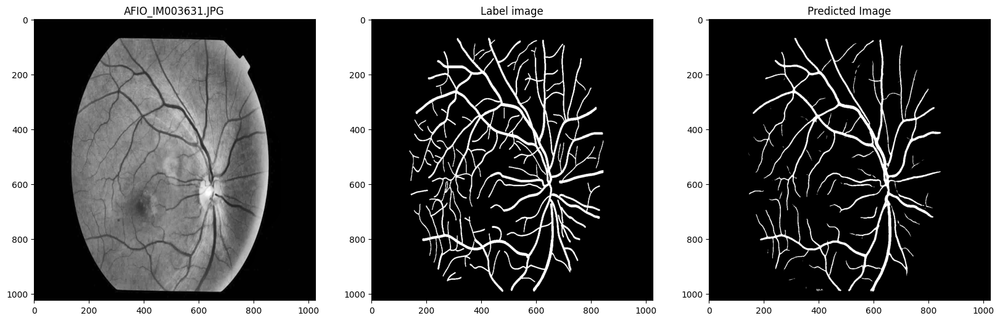

=====AFIO_IM004993.JPG result======
sensitivity: 0.5844129605778215
specificity: 0.9912727902931971
IOU: 0.5280078490428275


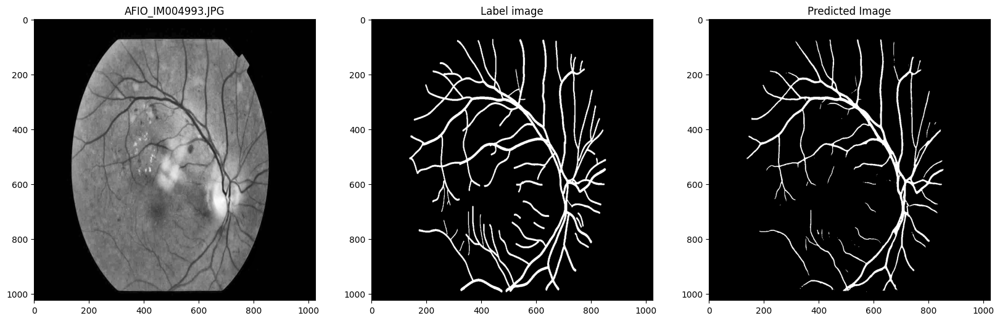

=====AFIO_IM002422.JPG result======
sensitivity: 0.5769008969215101
specificity: 0.993305586433317
IOU: 0.5344472861608411


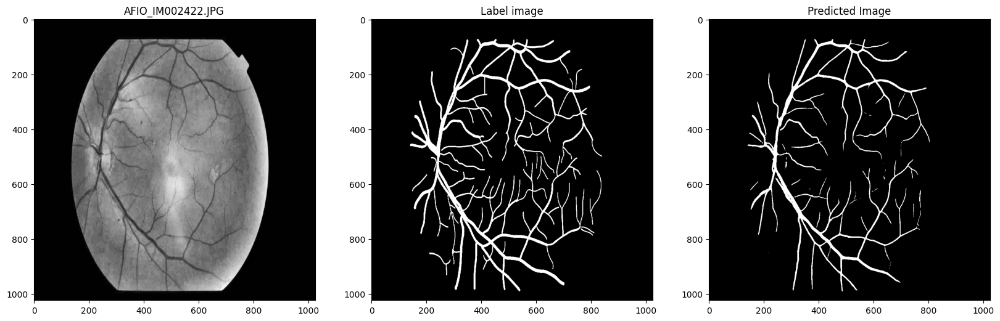

=====AFIO_IM006106.JPG result======
sensitivity: 0.5628970400236012
specificity: 0.9925323639804581
IOU: 0.5263007879662747


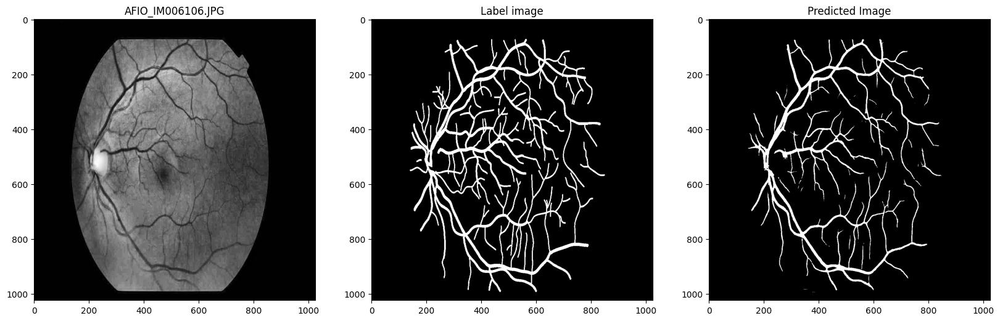

=====AFIO_IM005488.JPG result======
sensitivity: 0.5995932873760506
specificity: 0.9900252290532466
IOU: 0.5513032738376032


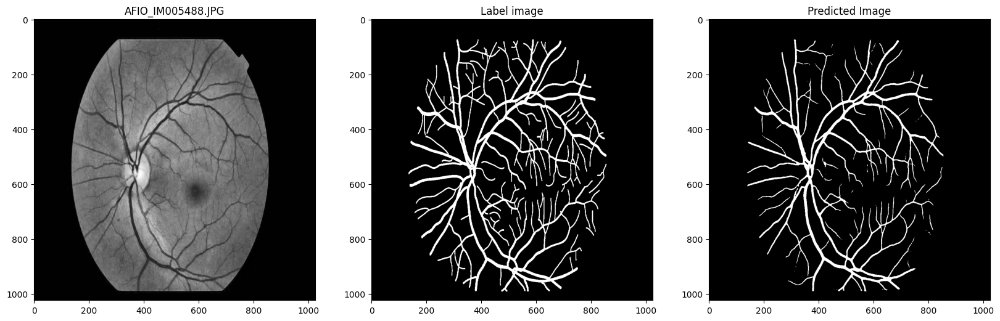

=====AFIO_IM005456.JPG result======
sensitivity: 0.5940337995511229
specificity: 0.9911117633091714
IOU: 0.5258615018223445


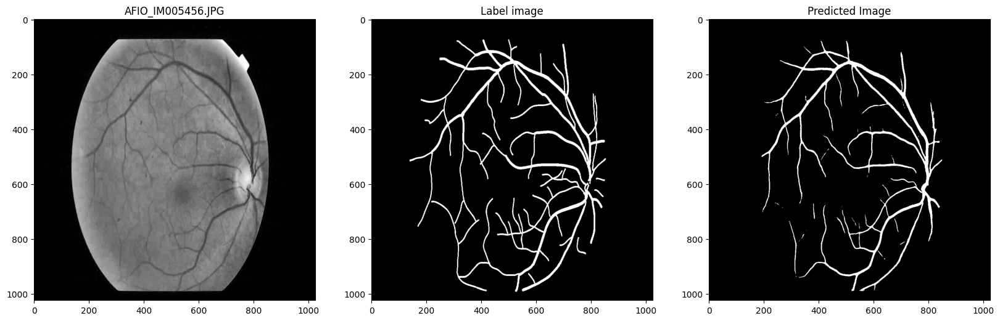

=====AFIO_IM005321.JPG result======
sensitivity: 0.6569096538136786
specificity: 0.9892442435854799
IOU: 0.54703125


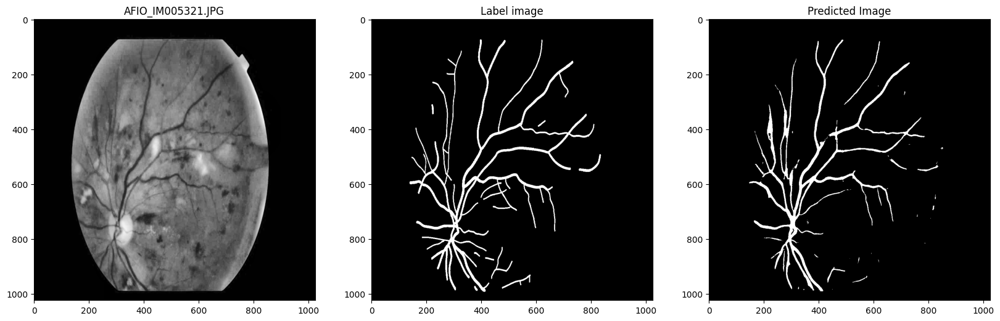

=====AFIO_IM005092.JPG result======
sensitivity: 0.5923876055886945
specificity: 0.9921921447093796
IOU: 0.5515034056073721


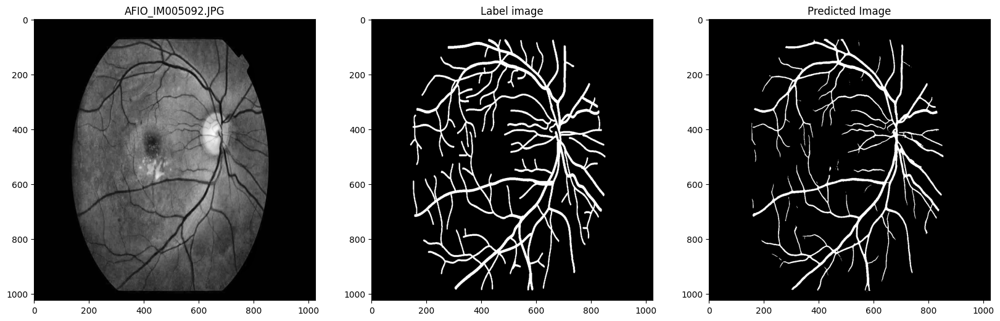

=====AFIO_IM004539.JPG result======
sensitivity: 0.5150310988251555
specificity: 0.9943244954653158
IOU: 0.47687734126084813


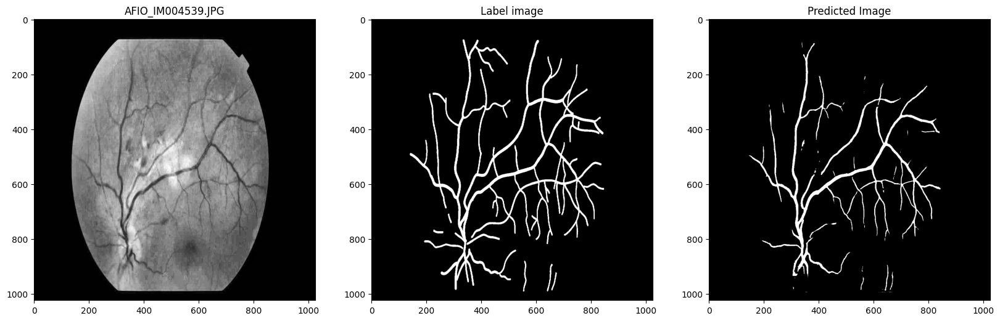

=====AFIO_IM004515.JPG result======
sensitivity: 0.5938373478546531
specificity: 0.9927000751999683
IOU: 0.5508998119795864


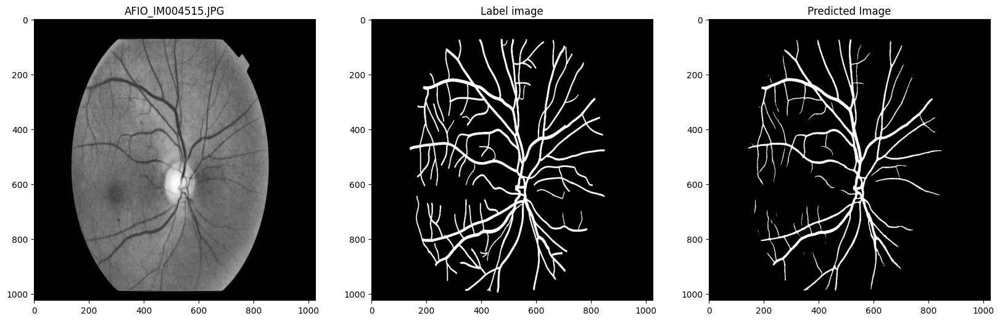

=====AFIO_IM002587.JPG result======
sensitivity: 0.629248611903897
specificity: 0.9924415229358554
IOU: 0.5745199995262179


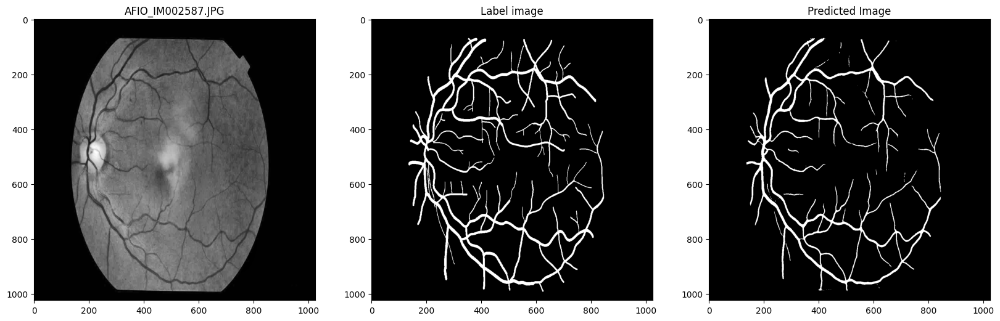

In [2]:
custom_objects = {'DiceLoss': loss.DiceLoss(), 
                  'sensitivity': metrics.sensitivity,
                  'specificity': metrics.specificity,
                  'accuracy' : metrics.accuracy,
                  'f1_score' : metrics.f1_score,
                  'iou' : metrics.iou}

MODEL_PATH = '/visuworks/Blindless_AIFFELTON/Ablation Study/Dense_Unet/model_parameters/dense_unet_50ep_1024_fG_wo_slice.tf/40--0.1586-0.8102-0.9867-0.2157-0.7390-0.9843.pb'
TEST_SOURCE = '/visuworks/Dataset/Selected Dataset 3/Test'
test_preproc = preprocess.build_augmentation_for_general(INPUT_SHAPE[0], INPUT_SHAPE[0], is_train=False)
model = tf.keras.models.load_model(MODEL_PATH, custom_objects=custom_objects)

# file_list = ["AFIO", "ARIA", "Chase", "DR_HAGIS", "DRIVE", "DualModal", "FIVES", "HRF", "IOSTAR", "LES-AV", "ORVS", "RETA", "STARE", "TREND", "UoA-DR"]
# for file in file_list:
metrics.plot_result(TEST_SOURCE, "AFIO", model=model, img_size=INPUT_SHAPE, preproc=test_preproc)